# Augmentation strategies
While deep learning techniques have been extremely successful in computer vision tasks like image recognition, segmentation, or object detection, the underlying algorithms are typically extremely data-intensive: they require large amounts of data to avoid overfitting. However, not all domains of interest satisfy that requirement, which is where data augmentation comes in. This is the name for a group of image processing techniques that create modified versions of images, thus enhancing the size and quality of training datasets, leading to better performance of deep learning models.

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In this section, we will review some of the more common augmentation techniques, along with choices for their software implementations. The most frequently used transformations include:

- Flipping: Flipping the image (along the horizontal or vertical axis)
- Rotation: Rotating the image by a given angle (clockwise or anti-clockwise)
- Cropping: A random subsection of the image is selected
- Brightness: Modifying the brightness of the image
- Scaling: The image is increased or decreased to a higher (outward) or lower (inward) size

On a high level, we can say that augmentations can be applied in one of two ways:

- Offline: These are usually applied for smaller datasets (fewer images or smaller sizes, although the definition of “small” depends on the available hardware). The idea is to generate modified versions of the original images as a preprocessing step for your dataset, and then use those alongside the “original” ones.
- Online: These are used for bigger datasets. The augmented images are not saved on disk; the augmentations are applied in mini-batches and fed to the model.
In the next few sections, we will give you an overview of two of the most common methods for augmenting your image dataset: the built-in Keras functionality and the albumentations package. There are several other options available out there (skimage, OpenCV, imgaug, Augmentor, SOLT), but we will focus on the most popular ones.

# Image augmentation to the rescue¶
Image augmentation is a process of creating new training examples from the existing ones. To make a new sample, you slightly change the original image. For instance, you could make a new image a little brighter; you could cut a piece from the original image; you could make a new image by mirroring the original one, etc.

Here are some examples of transformations of the original image that will create a new training sample.



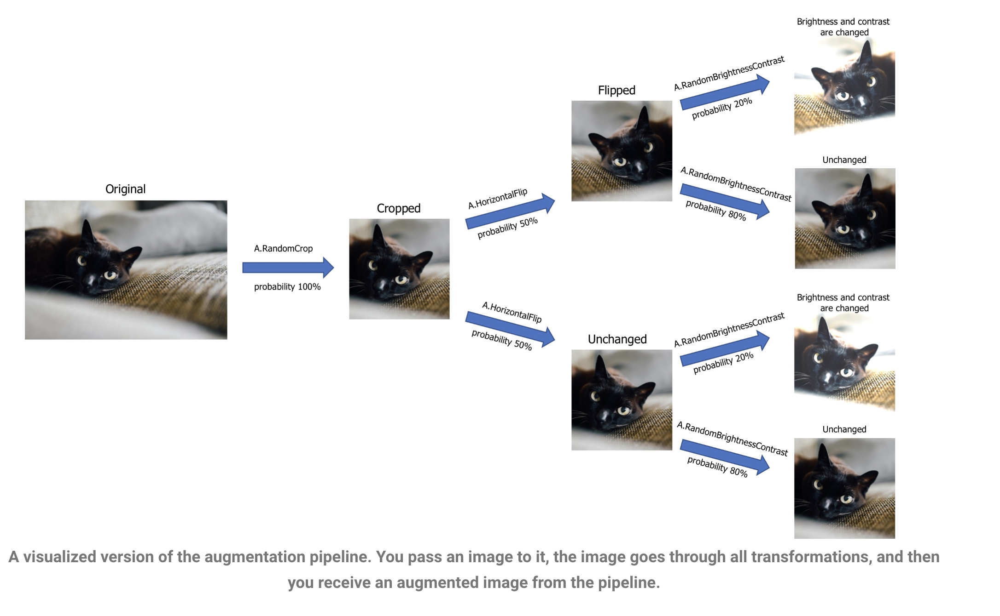

In [1]:
!pip install -Uqqq albumentations pillow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 10.1 MB/s eta 0:00:00


100%|██████████| 15/15 [00:00<00:00, 32.61it/s]


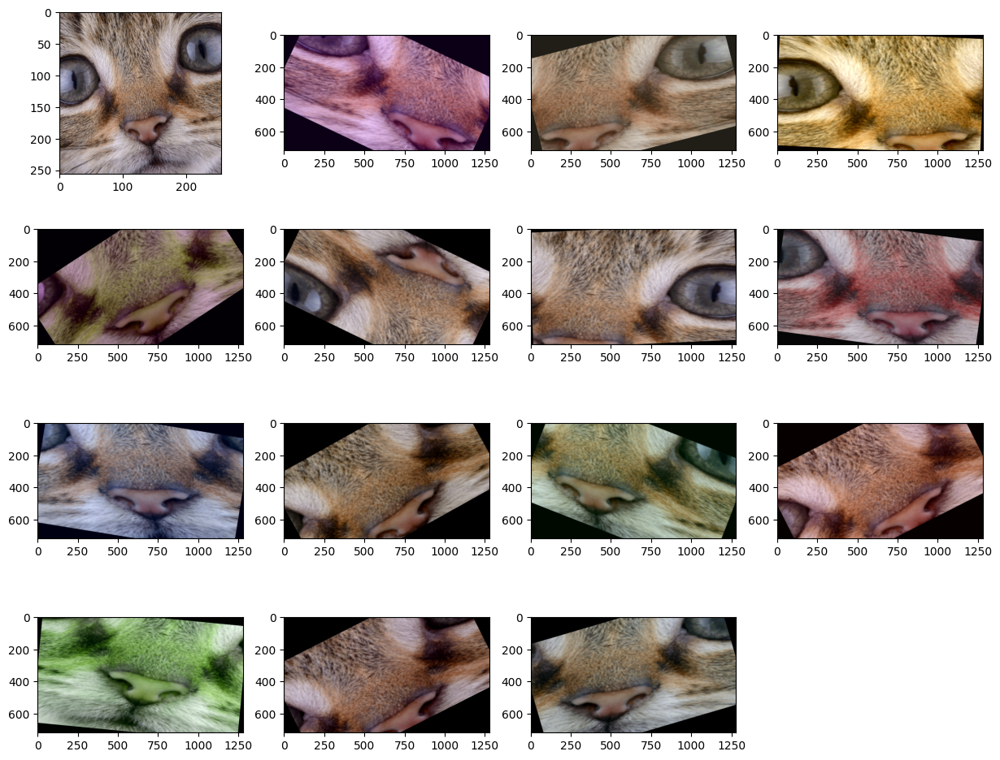

In [ ]:
import cv2
import albumentations as A
import numpy as np
from utils import plot_examples
from PIL import Image
from tqdm import tqdm

image = Image.open("/content/drive/MyDrive/image-cats/cat1.png")

transform = A.Compose(
    [
        A.Resize(width=1920, height=1080),
        A.RandomCrop(width=1280, height=720),
        A.Rotate(limit=40, p=0.9, border_mode=cv2.BORDER_CONSTANT),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.1),
        A.RGBShift(r_shift_limit=25, g_shift_limit=25, b_shift_limit=25, p=0.9),
        A.OneOf(
            [
                A.Blur(blur_limit=3, p=0.5),
                A.ColorJitter(p=0.5),
            ],
            p=1.0,
        ),
    ]
)

images_list = [image]
image = np.array(image)
for i in tqdm(range(15)):
    augmentations = transform(image=image)
    augmented_img = augmentations["image"]
    images_list.append(augmented_img)
plot_examples(images_list)

# Why Albumentations¶
A single interface to work with images, masks, bounding boxes, and key points.¶
Albumentations provides a single interface to work with different computer vision tasks such as classification, semantic segmentation, instance segmentation, object detection, pose estimation, etc.



# Mask augmentation for segmentation

The process of augmenting images and masks looks very similar to the regular image-only augmentation.

- You import the required libraries.
- You define an augmentation pipeline.
- You read images and masks from the disk.
- You pass an image and one or more masks to the augmentation pipeline and receive augmented images and masks.

100%|██████████| 4/4 [00:00<00:00, 18.81it/s]


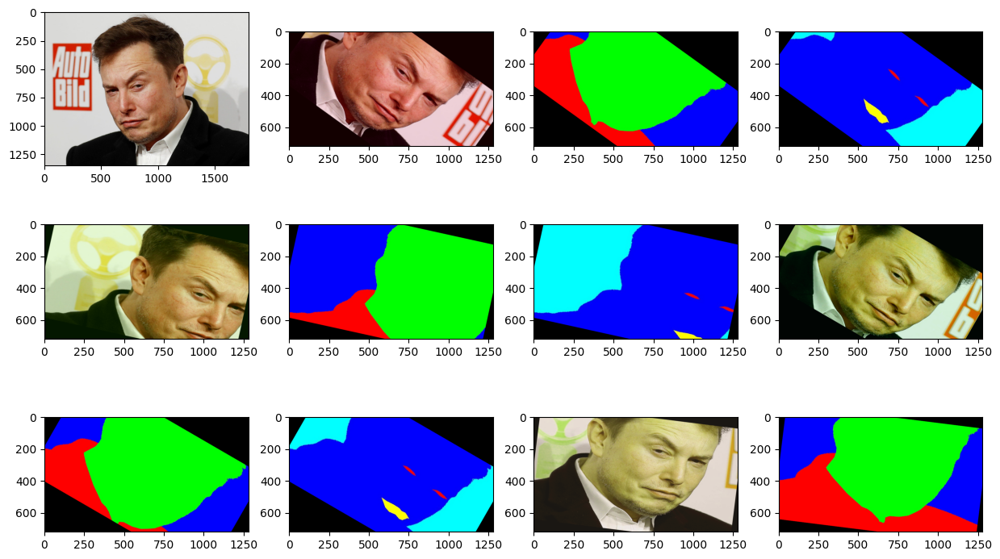

In [ ]:
import cv2
import albumentations as A
import numpy as np
from utils import plot_examples
from PIL import Image

image = Image.open("./elon.jpeg")
mask = Image.open("./mask.jpeg")
mask2 = Image.open("./second_mask.jpeg")

transform = A.Compose(
    [
        A.Resize(width=1920, height=1080),
        A.RandomCrop(width=1280, height=720),
        A.Rotate(limit=40, p=0.9, border_mode=cv2.BORDER_CONSTANT),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.1),
        A.RGBShift(r_shift_limit=25, g_shift_limit=25, b_shift_limit=25, p=0.9),
        A.OneOf([
            A.Blur(blur_limit=3, p=0.5),
            A.ColorJitter(p=0.5),
        ], p=1.0),
    ]
)

images_list = [image]
image = np.array(image)
mask = np.array(mask) # np.asarray(mask), np.array(mask)
mask2 = np.array(mask2)

for i in tqdm(range(4)):
    augmentations = transform(image=image, masks=[mask, mask2])
    augmented_img = augmentations["image"]
    augmented_masks = augmentations["masks"]
    images_list.append(augmented_img)
    images_list.append(augmented_masks[0])
    images_list.append(augmented_masks[1])
plot_examples(images_list)



# Bounding boxes augmentation for object detection

Different annotations formats¶
Bounding boxes are rectangles that mark objects on an image. There are multiple formats of bounding boxes annotations. Each format uses its specific representation of bouning boxes coordinates. Albumentations supports four formats: pascal_voc, albumentations, coco, and yolo .

Let's take a look at each of those formats and how they represent coordinates of bounding boxes.

As an example, we will use an image from the dataset named Common Objects in Context. It contains one bounding box that marks a cat. The image width is 640 pixels, and its height is 480 pixels. The width of the bounding box is 322 pixels, and its height is 117 pixels.

The bounding box has the following (x, y) coordinates of its corners: top-left is (x_min, y_min) or (98px, 345px), top-right is (x_max, y_min) or (420px, 345px), bottom-left is (x_min, y_max) or (98px, 462px), bottom-right is (x_max, y_max) or (420px, 462px). As you see, coordinates of the bounding box's corners are calculated with respect to the top-left corner of the image which has (x, y) coordinates (0, 0).

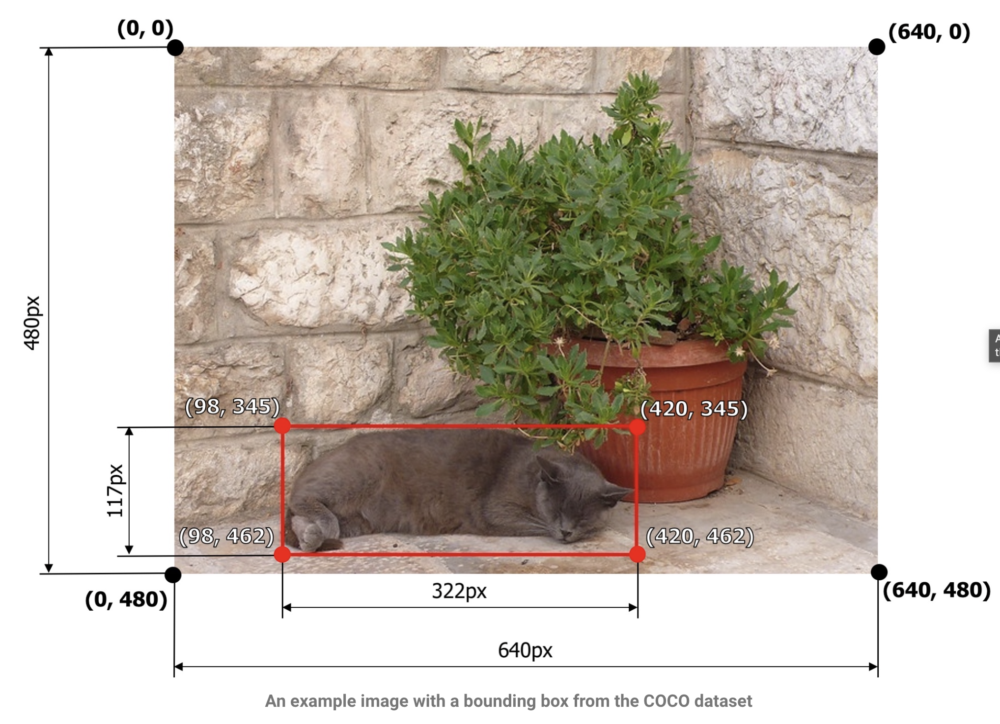

pascal_voc¶
pascal_voc is a format used by the Pascal VOC dataset. Coordinates of a bounding box are encoded with four values in pixels: [x_min, y_min, x_max, y_max]. x_min and y_min are coordinates of the top-left corner of the bounding box. x_max and y_max are coordinates of bottom-right corner of the bounding box.

Coordinates of the example bounding box in this format are [98, 345, 420, 462].

albumentations¶
albumentations is similar to pascal_voc, because it also uses four values [x_min, y_min, x_max, y_max] to represent a bounding box. But unlike pascal_voc, albumentations uses normalized values. To normalize values, we divide coordinates in pixels for the x- and y-axis by the width and the height of the image.

Coordinates of the example bounding box in this format are [98 / 640, 345 / 480, 420 / 640, 462 / 480] which are [0.153125, 0.71875, 0.65625, 0.9625].

Albumentations uses this format internally to work with bounding boxes and augment them.

coco¶
coco is a format used by the Common Objects in Context dataset.

In coco, a bounding box is defined by four values in pixels [x_min, y_min, width, height]. They are coordinates of the top-left corner along with the width and height of the bounding box.

Coordinates of the example bounding box in this format are [98, 345, 322, 117].

yolo¶
In yolo, a bounding box is represented by four values [x_center, y_center, width, height]. x_center and y_center are the normalized coordinates of the center of the bounding box. To make coordinates normalized, we take pixel values of x and y, which marks the center of the bounding box on the x- and y-axis. Then we divide the value of x by the width of the image and value of y by the height of the image. width and height represent the width and the height of the bounding box. They are normalized as well.

Coordinates of the example bounding box in this format are [((420 + 98) / 2) / 640, ((462 + 345) / 2) / 480, 322 / 640, 117 / 480] which are [0.4046875, 0.840625, 0.503125, 0.24375].

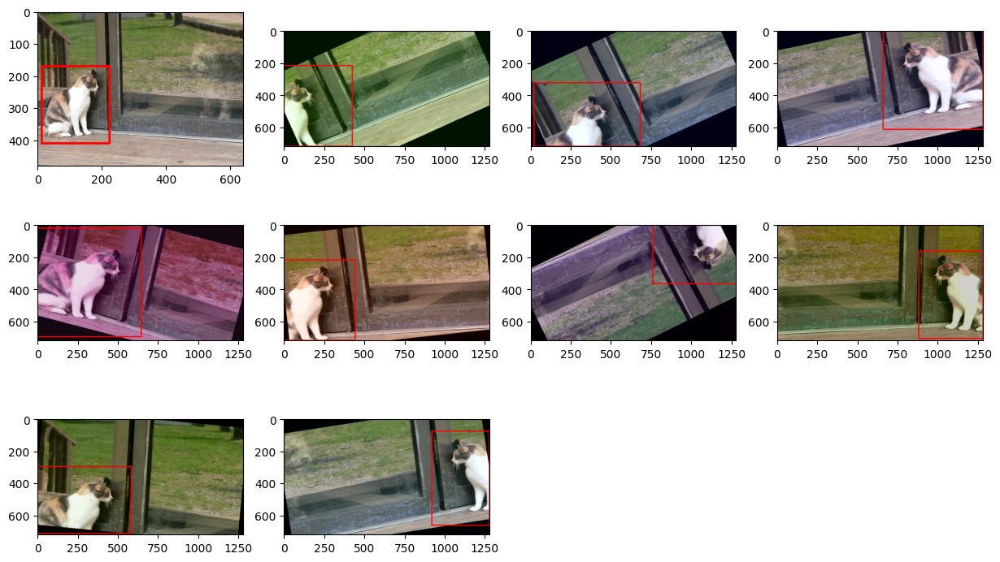

In [ ]:
import cv2
import albumentations as A
import numpy as np
from utils import plot_examples
from PIL import Image

image = cv2.imread("./cat.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
bboxes = [[13, 170, 224, 410]]

# Pascal_voc (x_min, y_min, x_max, y_max), YOLO, COCO

transform = A.Compose(
    [
        A.Resize(width=1920, height=1080),
        A.RandomCrop(width=1280, height=720),
        A.Rotate(limit=40, p=0.9, border_mode=cv2.BORDER_CONSTANT),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.1),
        A.RGBShift(r_shift_limit=25, g_shift_limit=25, b_shift_limit=25, p=0.9),
        A.OneOf([
            A.Blur(blur_limit=3, p=0.5),
            A.ColorJitter(p=0.5),
        ], p=1.0),
    ], bbox_params=A.BboxParams(format="pascal_voc", min_area=2048,
                                min_visibility=0.3, label_fields=[])
)

images_list = [image]
saved_bboxes = [bboxes[0]]
for i in range(15):
    augmentations = transform(image=image, bboxes=bboxes)
    augmented_img = augmentations["image"]

    if len(augmentations["bboxes"]) == 0:
        continue

    images_list.append(augmented_img)
    saved_bboxes.append(augmentations["bboxes"][0])

plot_examples(images_list, saved_bboxes)

# Keypoints augmentation¶
Computer vision tasks such as human pose estimation, face detection, and emotion recognition usually work with keypoints on the image.

In the case of pose estimation, keypoints mark human joints such as shoulder, elbow, wrist, knee, etc.

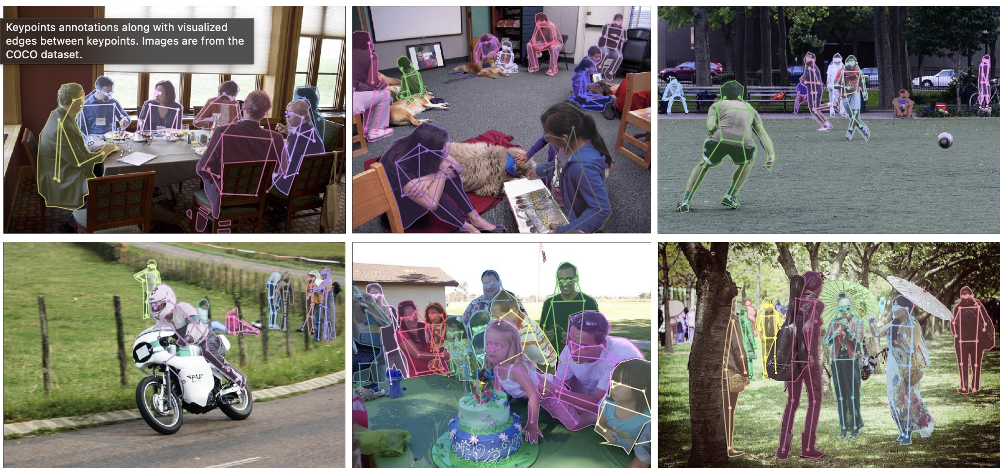

# https://www.kaggle.com/code/caddis/solution-using-pytorch-albumentation-mlflow

In [ ]:
import torch
import numpy as np
import cv2
from PIL import Image
import torch.nn as nn
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torch.utils.data import Dataset
import os


class ImageFolder(Dataset):
    def __init__(self, root_dir, transform=None):
        super(ImageFolder, self).__init__()
        self.data = []
        self.root_dir = root_dir
        self.transform = transform
        self.class_names = os.listdir(root_dir)

        for index, name in enumerate(self.class_names):
            files = os.listdir(os.path.join(root_dir, name))
            self.data += list(zip(files, [index] * len(files)))

    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):
        img_file, label = self.data[index]
        root_and_dir = os.path.join(self.root_dir, self.class_names[label])
        image = np.array(Image.open(os.path.join(root_and_dir, img_file)))

        if self.transform is not None:
            augmentations = self.transform(image=image)
            image = augmentations["image"]

        return image, label


transform = A.Compose(
    [
        A.Resize(width=1920, height=1080),
        A.RandomCrop(width=1280, height=720),
        A.Rotate(limit=40, p=0.9, border_mode=cv2.BORDER_CONSTANT),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.1),
        A.RGBShift(r_shift_limit=25, g_shift_limit=25, b_shift_limit=25, p=0.9),
        A.OneOf(
            [
                A.Blur(blur_limit=3, p=0.5),
                A.ColorJitter(p=0.5),
            ],
            p=1.0,
        ),
        A.Normalize(
            mean=[0, 0, 0],
            std=[1, 1, 1],
            max_pixel_value=255,
        ),
        ToTensorV2(),
    ]
)

dataset = ImageFolder(root_dir="/content/drive/MyDrive/cat_dogs", transform=transform)

for x, y in dataset:
    print(x.shape)

torch.Size([3, 720, 1280])
torch.Size([3, 720, 1280])
torch.Size([3, 720, 1280])
torch.Size([3, 720, 1280])
torch.Size([3, 720, 1280])
torch.Size([3, 720, 1280])
torch.Size([3, 720, 1280])
torch.Size([3, 720, 1280])
torch.Size([3, 720, 1280])
torch.Size([3, 720, 1280])
torch.Size([3, 720, 1280])
torch.Size([3, 720, 1280])
torch.Size([3, 720, 1280])
torch.Size([3, 720, 1280])
torch.Size([3, 720, 1280])
torch.Size([3, 720, 1280])
torch.Size([3, 720, 1280])
torch.Size([3, 720, 1280])
torch.Size([3, 720, 1280])


In [3]:
# """
# Example of how to create custom dataset in Pytorch. In this case
# we have images of cats and dogs in a separate folder and a csv
# file containing the name to the jpg file as well as the target
# label (0 for cat, 1 for dog).

# Programmed by Aladdin Persson <aladdin.persson at hotmail dot com>
# *    2020-04-03 Initial coding
# *    2022-12-19 Updated with better comments, improved code using PIL, and checked code still functions as intended.
# """

# # Imports
# import torch
# import torch.nn as nn  # All neural network modules, nn.Linear, nn.Conv2d, BatchNorm, Loss functions
# import torch.optim as optim  # For all Optimization algorithms, SGD, Adam, etc.
# import torchvision.transforms as transforms  # Transformations we can perform on our dataset
# import torchvision
# import os
# import pandas as pd
# from PIL import Image
# from torch.utils.data import (
#     Dataset,
#     DataLoader,
# )  # Gives easier dataset managment and creates mini batches


# class CatsAndDogsDataset(Dataset):
#     def __init__(self, csv_file, root_dir, transform=None):
#         self.annotations = pd.read_csv(csv_file)
#         self.root_dir = root_dir
#         self.transform = transform

#     def __len__(self):
#         return len(self.annotations)

#     def __getitem__(self, index):
#         img_path = os.path.join(self.root_dir, self.annotations.iloc[index, 0])
#         image = Image.open(img_path)
#         y_label = torch.tensor(int(self.annotations.iloc[index, 1]))

#         if self.transform:
#             image = self.transform(image)

#         return (image, y_label)


# # Set device
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# # Hyperparameters
# in_channel = 3
# num_classes = 2
# learning_rate = 3e-4
# batch_size = 32
# num_epochs = 10

# # Load Data
# dataset = CatsAndDogsDataset(
#     csv_file="./cats_dogs.csv",
#     root_dir="./drive/MyDrive/cats_dogs_resized",
#     transform=transforms.ToTensor(),
# )

# # Dataset is actually a lot larger ~25k images, just took out 10 pictures
# # to upload to Github. It's enough to understand the structure and scale
# # if you got more images.
# train_set, test_set = torch.utils.data.random_split(dataset, [5, 5])
# train_loader = DataLoader(dataset=train_set, batch_size=batch_size, shuffle=True)
# test_loader = DataLoader(dataset=test_set, batch_size=batch_size, shuffle=True)

# # Model
# model = torchvision.models.googlenet(weights="DEFAULT")

# # freeze all layers, change final linear layer with num_classes
# for param in model.parameters():
#     param.requires_grad = False

# # final layer is not frozen
# model.fc = nn.Linear(in_features=1024, out_features=num_classes)
# model.to(device)

# # Loss and optimizer
# criterion = nn.CrossEntropyLoss()
# optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=1e-5)

# # Train Network
# for epoch in range(num_epochs):
#     losses = []

#     for batch_idx, (data, targets) in enumerate(train_loader):
#         # Get data to cuda if possible
#         data = data.to(device=device)
#         targets = targets.to(device=device)

#         # forward
#         scores = model(data)
#         loss = criterion(scores, targets)

#         losses.append(loss.item())

#         # backward
#         optimizer.zero_grad()
#         loss.backward()

#         # gradient descent or adam step
#         optimizer.step()

#     print(f"Cost at epoch {epoch} is {sum(losses)/len(losses)}")

# # Check accuracy on training to see how good our model is
# def check_accuracy(loader, model):
#     num_correct = 0
#     num_samples = 0
#     model.eval()

#     with torch.no_grad():
#         for x, y in loader:
#             x = x.to(device=device)
#             y = y.to(device=device)

#             scores = model(x)
#             _, predictions = scores.max(1)
#             num_correct += (predictions == y).sum()
#             num_samples += predictions.size(0)

#         print(
#             f"Got {num_correct} / {num_samples} with accuracy {float(num_correct)/float(num_samples)*100:.2f}"
#         )

#     model.train()


# print("Checking accuracy on Training Set")
# check_accuracy(train_loader, model)

# print("Checking accuracy on Test Set")
# check_accuracy(test_loader, model)

Downloading: "https://download.pytorch.org/models/googlenet-1378be20.pth" to /root/.cache/torch/hub/checkpoints/googlenet-1378be20.pth
100%|██████████| 49.7M/49.7M [00:00<00:00, 57.0MB/s]


Cost at epoch 0 is 0.6055222749710083
Cost at epoch 1 is 0.5207028388977051
Cost at epoch 2 is 0.5252637267112732
Cost at epoch 3 is 0.47386837005615234
Cost at epoch 4 is 0.4675242304801941
Cost at epoch 5 is 0.3766714632511139
Cost at epoch 6 is 0.37507933378219604
Cost at epoch 7 is 0.3665218949317932
Cost at epoch 8 is 0.36120957136154175
Cost at epoch 9 is 0.3683190643787384
Checking accuracy on Training Set
Got 4 / 5 with accuracy 80.00
Checking accuracy on Test Set
Got 4 / 5 with accuracy 80.00


# 2D_and_3D_facial_keypoints

In [4]:
!pip install -qU face-alignment torch_snippets
import face_alignment
from torch_snippets import read, show

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.4/61.4 kB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.0/60.0 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 8.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 202.8/202.8 kB 18.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 48.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 41.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.8/98.8 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 60.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.5/172.5 kB 15.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 75.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 468.9/468.9 kB 36.7 MB/s eta 0:00:

In [5]:
!wget https://www.dropbox.com/s/2s7xjto7rb6q7dc/Hema.JPG

--2023-08-14 15:24:12--  https://www.dropbox.com/s/2s7xjto7rb6q7dc/Hema.JPG
Resolving www.dropbox.com (www.dropbox.com)... 162.125.3.18, 2620:100:6018:18::a27d:312
Connecting to www.dropbox.com (www.dropbox.com)|162.125.3.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: /s/raw/2s7xjto7rb6q7dc/Hema.JPG [following]
--2023-08-14 15:24:12--  https://www.dropbox.com/s/raw/2s7xjto7rb6q7dc/Hema.JPG
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc2ff8cf958b4dcaadf6fb0a721e.dl.dropboxusercontent.com/cd/0/inline/CBxlEYhoTe-07EpADc5UTbWNUobWm8oAmn0F_-QXOxpOwdeB5hy5GBZy4PFNPiuDMSI8pj-bcTDR1nCSIhzln6_l9JFAcQ8HvHQdj3lp5T1CNODWy8tjeUid--9YjCrtCW7GjGQKzT7P_sLtViZyms_E/file# [following]
--2023-08-14 15:24:12--  https://uc2ff8cf958b4dcaadf6fb0a721e.dl.dropboxusercontent.com/cd/0/inline/CBxlEYhoTe-07EpADc5UTbWNUobWm8oAmn0F_-QXOxpOwdeB5hy5GBZy4PFNPiuDMSI8pj-bcTDR1nCSIhzln6_l9JFAcQ8HvHQdj3lp5T1CNODWy8

In [8]:
import torchvision
import torch.nn as nn
import torch
import torch.nn.functional as F
from torchvision import transforms, models, datasets
from torchsummary import summary
import numpy as np, pandas as pd, os, glob
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import matplotlib
import glob
from sklearn import cluster
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [10]:
!git clone https://github.com/udacity/P1_Facial_Keypoints.git
!cd P1_Facial_Keypoints
root_dir = 'P1_Facial_Keypoints/data/training/'
all_img_paths = glob.glob(os.path.join(root_dir, '*.jpg'))
data = pd.read_csv('P1_Facial_Keypoints/data/training_frames_keypoints.csv')

fatal: destination path 'P1_Facial_Keypoints' already exists and is not an empty directory.


In [11]:
from torch.utils.data import TensorDataset, DataLoader, Dataset
import cv2, numpy as np
from copy import deepcopy
class FacesData(Dataset):
    def __init__(self, df):
        super(FacesData).__init__()
        self.df = df
        self.normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                              std=[0.229, 0.224, 0.225])
    def __len__(self): return len(self.df)
    def __getitem__(self, ix):
        img_path = 'P1_Facial_Keypoints/data/training/' + self.df.iloc[ix,0]
        img = cv2.imread(img_path)/255.
        kp = deepcopy(self.df.iloc[ix,1:].tolist())
        kp_x = (np.array(kp[0::2])/img.shape[1]).tolist()
        kp_y = (np.array(kp[1::2])/img.shape[0]).tolist()
        kp2 = kp_x + kp_y
        kp2 = torch.tensor(kp2)
        img = self.preprocess_input(img)
        return img, kp2
    def preprocess_input(self, img):
        img = cv2.resize(img, (224,224))
        img = torch.tensor(img).permute(2,0,1)
        img = self.normalize(img).float()
        return img.to(device)
    def load_img(self, ix):
        img_path = 'P1_Facial_Keypoints/data/training/' + self.df.iloc[ix,0]
        img = cv2.imread(img_path)
        img =cv2.cvtColor(img, cv2.COLOR_BGR2RGB)/255.
        img = cv2.resize(img, (224,224))
        return img

In [12]:
from sklearn.model_selection import train_test_split

train, test = train_test_split(data, test_size=0.2, random_state=101)
train_dataset = FacesData(train.reset_index(drop=True))
test_dataset = FacesData(test.reset_index(drop=True))

train_loader = DataLoader(train_dataset, batch_size=32)
test_loader = DataLoader(test_dataset, batch_size=32)

In [13]:
def get_model():
    model = models.vgg16(pretrained=True)
    for param in model.parameters():
        param.requires_grad = False
    model.avgpool = nn.Sequential( nn.Conv2d(512,512,3),
      nn.MaxPool2d(2),
      nn.Flatten())
    model.classifier = nn.Sequential(
      nn.Linear(2048, 512),
      nn.ReLU(),
      nn.Dropout(0.5),
      nn.Linear(512, 136),
      nn.Sigmoid()
    )
    criterion = nn.L1Loss()
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
    return model.to(device), criterion, optimizer

In [14]:
model, criterion, optimizer = get_model()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:14<00:00, 39.0MB/s]


In [15]:
def train_batch(img, kps, model, optimizer, criterion):
    model.train()
    optimizer.zero_grad()
    _kps = model(img.to(device))
    loss = criterion(_kps, kps.to(device))
    loss.backward()
    optimizer.step()
    return loss

In [16]:
@torch.no_grad()
def validate_batch(img, kps, model, criterion):
    model.eval()
    _kps = model(img.to(device))
    loss = criterion(_kps, kps.to(device))
    return _kps, loss

In [17]:
train_loss, test_loss = [], []
n_epochs = 20

for epoch in range(n_epochs):
    print(f" epoch {epoch+ 1} : 50")
    epoch_train_loss, epoch_test_loss = 0, 0
    for ix, (img,kps) in enumerate(train_loader):
        loss = train_batch(img, kps, model, optimizer, criterion)
        epoch_train_loss += loss.item()
    epoch_train_loss /= (ix+1)

    for ix,(img,kps) in enumerate(test_loader):
        ps, loss = validate_batch(img, kps, model, criterion)
        epoch_test_loss += loss.item()
    epoch_test_loss /= (ix+1)

    train_loss.append(epoch_train_loss)
    test_loss.append(epoch_test_loss)

 epoch 1 : 50
 epoch 2 : 50


KeyboardInterrupt: ignored

In [ ]:
epochs = np.arange(50)+1
import matplotlib.ticker as mtick
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
%matplotlib inline
plt.plot(epochs, train_loss, 'bo', label='Training loss')
plt.plot(epochs, test_loss, 'r', label='Test loss')
plt.title('Training and Test loss over increasing epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid('off')
plt.show()

In [ ]:
ix = 0
plt.figure(figsize=(10,10))
plt.subplot(221)
plt.title('Original image')
im = test_dataset.load_img(ix)
plt.imshow(im)
plt.grid(False)
plt.subplot(222)
plt.title('Image with facial keypoints')
x, _ = test_dataset[ix]
plt.imshow(im)
kp = model(x[None]).flatten().detach().cpu()
plt.scatter(kp[:68]*224, kp[68:]*224, c='r')
plt.grid(False)
plt.show()

